In [2]:
%load_ext autoreload

In [16]:
from calibrate import CalibrateCamera
import matplotlib.image as mpimg
import cv2

calibrate = CalibrateCamera('../camera_cal/calibration*.jpg')

In [17]:
%autoreload
from gradient import ColorAndGradient
from perspective import Perspective
from findlanes import LaneDetection

import os
import num
import matplotlib.pyplot as plt
import scipy.misc
%matplotlib inline

files_directory = '/Users/nanda/Enlistment/courses/CarND/CarND-Advanced-Lane-Lines/test_images/'
output_directory = '/Users/nanda/Enlistment/courses/CarND/CarND-Advanced-Lane-Lines/output_images/'
fig = plt.figure(figsize=(36, 90))

num_files = len(os.listdir(files_directory))
i = 0
for filename in os.listdir(files_directory):
    img=mpimg.imread(files_directory + filename)
    parts = filename.split('.')
    
    undistorted = calibrate.undistort(img)
    scipy.misc.imsave(output_directory + 'undistorted_' + filename.split('.')[0]+ '.jpg', undistorted)
    
    gradient = ColorAndGradient(channel = 's', grad_channel='gray')
    color_binary = gradient.filterAndThreshold(undistorted)
    scipy.misc.imsave(output_directory + 'gradient_' + filename.split('.')[0]+ '.jpg', np.dstack((color_binary,color_binary,color_binary)))
    
    perspective = Perspective()
    warped = perspective.warp(color_binary)
    scipy.misc.imsave(output_directory + 'birdseye_' + filename.split('.')[0]+ '.jpg', np.dstack((warped,warped,warped)))
    
    lane_detection = LaneDetection()
    lane = lane_detection.detect(warped)
    banded = lane.visualize_band(undistorted, perspective)
    scipy.misc.imsave(output_directory + 'banded_' + filename.split('.')[0]+ '.jpg', banded)
    
    highlighted = lane.highlight_lane(undistorted, perspective)
    annotated = lane.annotate_image(highlighted)
    scipy.misc.imsave(output_directory + 'lane_' + filename.split('.')[0]+ '.jpg', annotated)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(img, aspect='equal')
    sub.set_title(filename, fontsize=50)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(undistorted, aspect='equal')
    sub.set_title('Undistorted Image', fontsize=50)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(np.dstack((color_binary, color_binary, color_binary)), aspect='equal')
    sub.set_title('Color And Gradient', fontsize=50)

fig.tight_layout() 
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('/Users/nanda/Enlistment/courses/CarND/CarND-Advanced-Lane-Lines/output_images/preprocessing.png')

NameError: name 'np' is not defined

  histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)



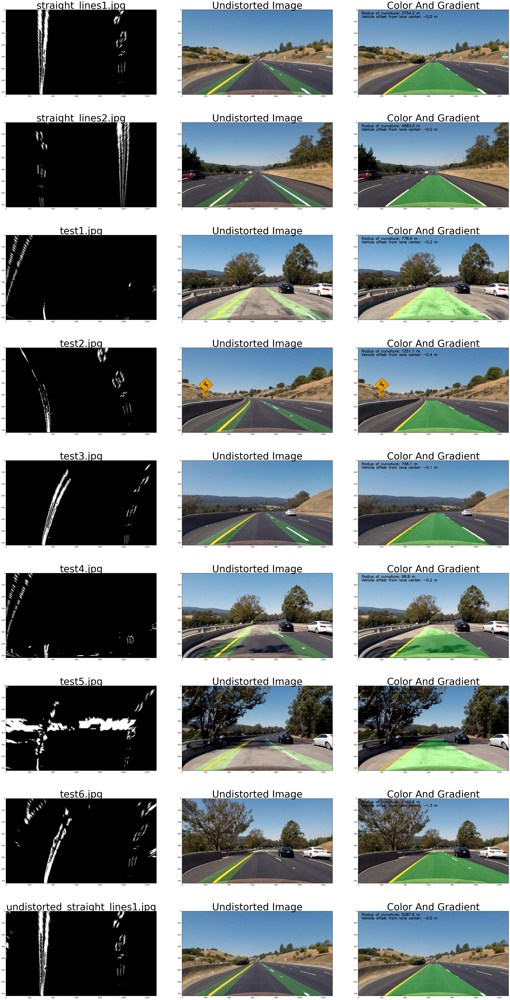

In [60]:
%autoreload
from gradient import ColorAndGradient
from perspective import Perspective
from findlanes import LaneDetection

import os
import matplotlib.pyplot as plt
%matplotlib inline

files_directory = '/Users/nanda/Enlistment/courses/CarND/CarND-Advanced-Lane-Lines/test_images/'
fig = plt.figure(figsize=(36, 81))

num_files = len(os.listdir(files_directory))
i = 0
for filename in os.listdir(files_directory):
    img=mpimg.imread(files_directory + filename)
    parts = filename.split('.')
    
    undistorted = calibrate.undistort(img)
    gradient = ColorAndGradient(channel = 's', grad_channel='gray')
    color_binary = gradient.filterAndThreshold(undistorted)
    perspective = Perspective()
    warped = perspective.warp(color_binary)
    lane_detection = LaneDetection()
    lane = lane_detection.detect(warped)
    banded = lane.visualize_band(undistorted, perspective)
    highlighted = lane.highlight_lane(undistorted, perspective)
    annotated = lane.annotate_image(highlighted)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(np.dstack((warped, warped, warped)), aspect='equal')
    sub.set_title(filename, fontsize=50)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(banded, aspect='equal')
    sub.set_title('Undistorted Image', fontsize=50)
    
    i = i + 1
    sub = fig.add_subplot(num_files,3,i)
    sub.imshow(annotated, aspect='equal')
    sub.set_title('Color And Gradient', fontsize=50)

fig.tight_layout() 
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
%autoreload
from video import VideoLaneDetection

video_file = '../project_video.mp4'
out_file = '../project_output.mp4'
video_lane_detection = VideoLaneDetection('../camera_cal/calibration*.jpg', video_file, out_file)
video_lane_detection.annotate_video()

  self.nchannels))

  histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)



[MoviePy] >>>> Building video ../project_output.mp4
[MoviePy] Writing video ../project_output.mp4






  0%|          | 0/1261 [00:00<?, ?it/s]



  0%|          | 1/1261 [00:00<05:29,  3.82it/s]



  0%|          | 2/1261 [00:00<05:27,  3.84it/s]



  0%|          | 3/1261 [00:00<05:25,  3.87it/s]



  0%|          | 4/1261 [00:00<05:12,  4.02it/s]



  0%|          | 5/1261 [00:01<05:05,  4.11it/s]



  0%|          | 6/1261 [00:01<05:21,  3.90it/s]



  1%|          | 7/1261 [00:01<05:46,  3.62it/s]



  1%|          | 8/1261 [00:02<05:46,  3.62it/s]



  1%|          | 9/1261 [00:02<05:30,  3.79it/s]



  1%|          | 10/1261 [00:02<05:28,  3.81it/s]



  1%|          | 11/1261 [00:02<05:14,  3.97it/s]



  1%|          | 12/1261 [00:03<05:07,  4.07it/s]



  1%|          | 13/1261 [00:03<05:01,  4.15it/s]



  1%|          | 14/1261 [00:03<04:56,  4.20it/s]



  1%|          | 15/1261 [00:03<04:52,  4.26it/s]



  1%|▏         | 16/1261 [00:03<04:49,  4.30it/s]



  1%|▏         | 17/1261 [00:04<04:49,  4.29it/s]



  1%|▏         | 18/1261 [00:04<04:49,  4.29it/s]



  2%|▏ 

[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_output.mp4 



In [11]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(out_file))